In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt
import os
import zipfile
from PIL import Image
from pathlib import Path
from typing import Tuple, Dict, List
import requests
from torchinfo import summary
%matplotlib inline

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [3]:
image_path = "/kaggle/input/pizza-steak-sushi/"
train_dir = os.path.join(image_path, "train")
test_dir = os.path.join(image_path, "test")

print(train_dir, test_dir)

/kaggle/input/pizza-steak-sushi/train /kaggle/input/pizza-steak-sushi/test


# visualize images from train data

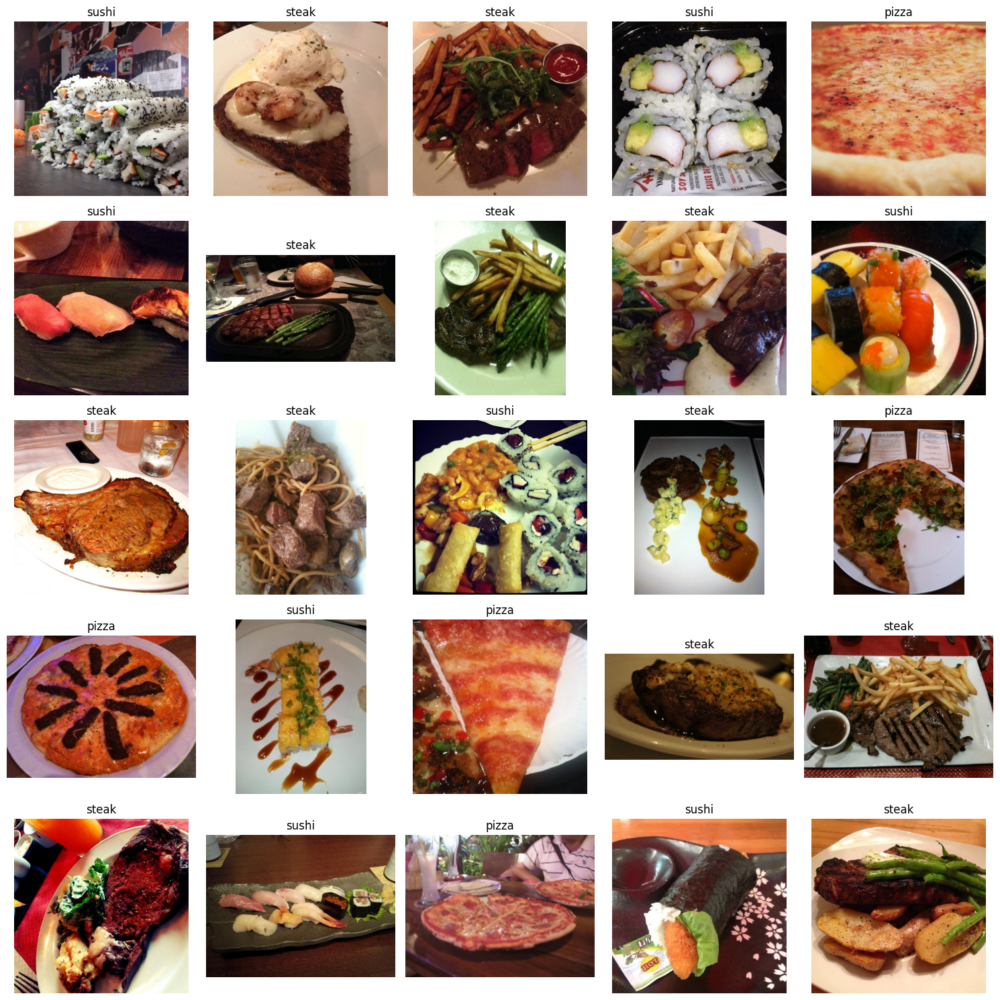

In [4]:
import random
classes = os.listdir(train_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(train_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()


# visualize Images from test data

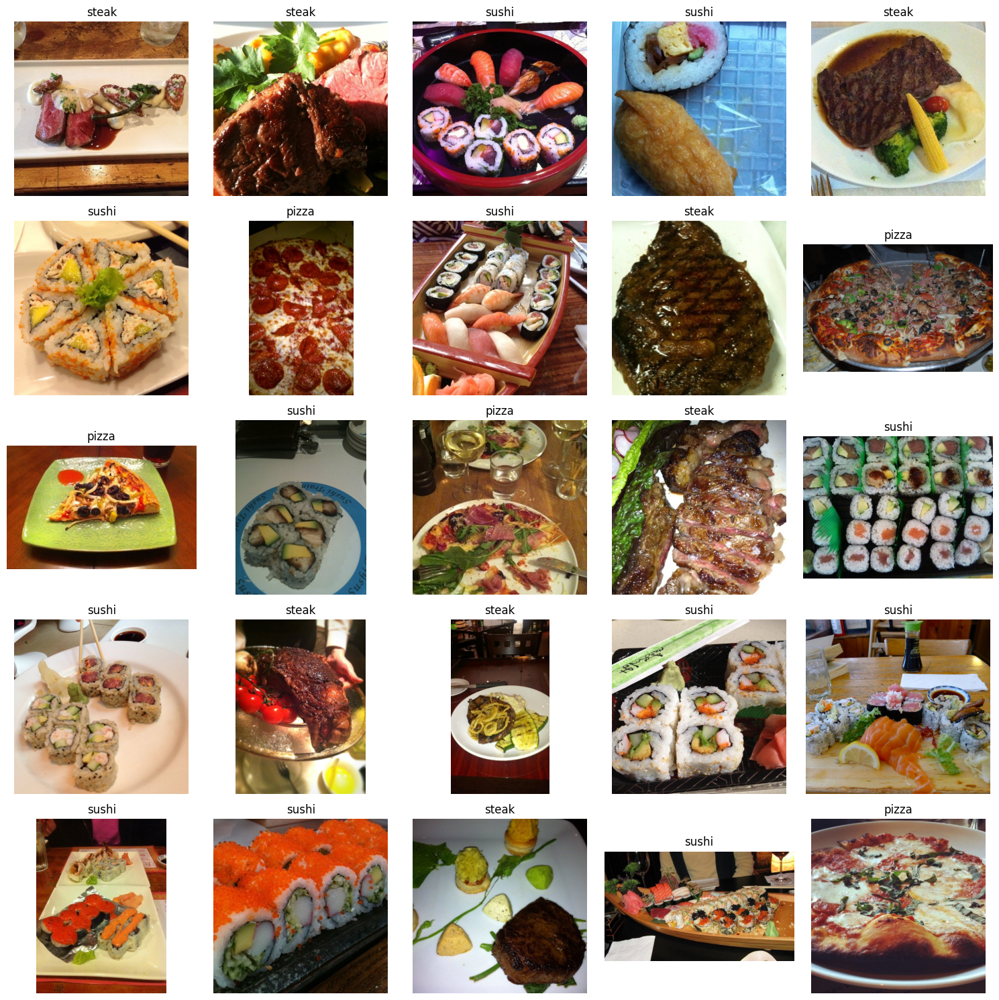

In [5]:
classes = os.listdir(test_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(test_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

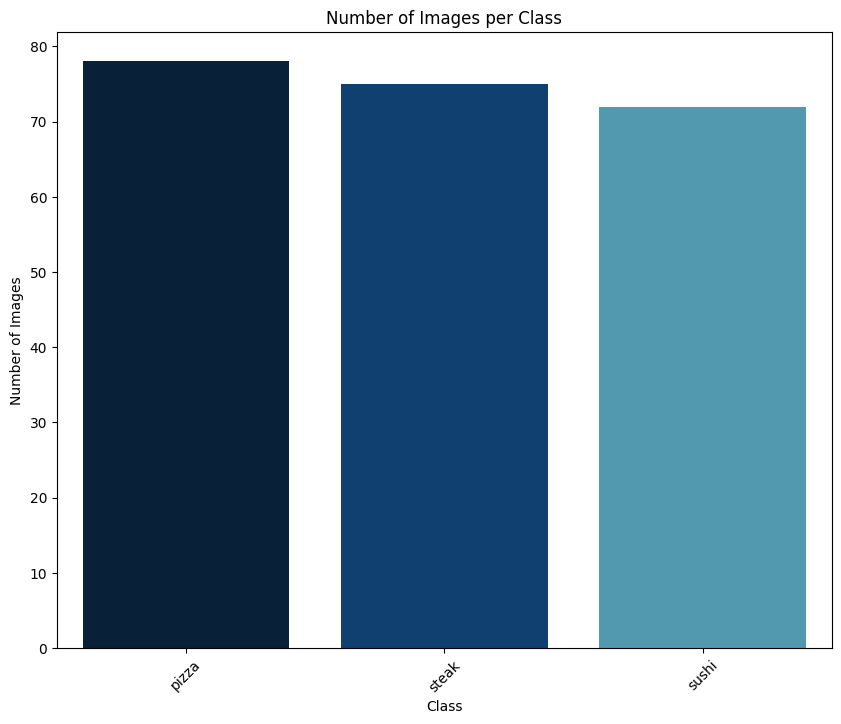

In [6]:
import pandas as pd
import seaborn as sns
new_path="/kaggle/input/pizza-steak-sushi/train/"
class_names = ['pizza', 'steak', 'sushi']  
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
sns.barplot(data=df, x='Class', y='Count', palette='ocean')
plt.title('Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

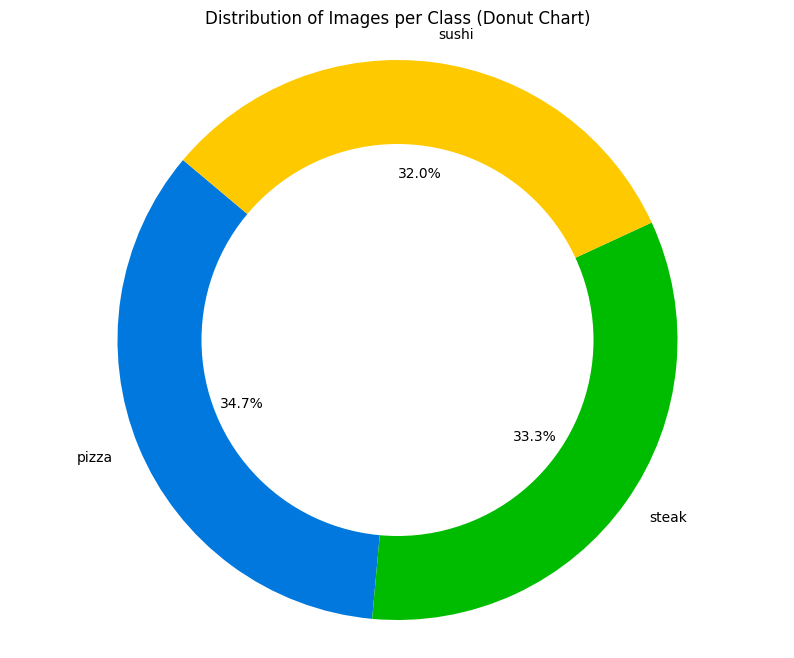

In [7]:
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
plt.pie(df['Count'], labels=df['Class'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("nipy_spectral", len(class_names)))
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Images per Class (Donut Chart)')
plt.show()

In [8]:
image_path = "/kaggle/input/pizza-steak-sushi/"
train_dir = os.path.join(image_path, "train")
test_dir = os.path.join(image_path, "test")

print(train_dir, test_dir)

/kaggle/input/pizza-steak-sushi/train /kaggle/input/pizza-steak-sushi/test


In [9]:
!git clone https://github.com/mrdbourke/pytorch-deep-learning
!mv pytorch-deep-learning/going_modular .
!rm -rf pytorch-deep-learning

Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4356, done.
remote: Counting objects: 100% (321/321), done.
remote: Compressing objects: 100% (142/142), done.
remote: Total 4356 (delta 213), reused 254 (delta 178), pack-reused 4035 (from 1)
Receiving objects: 100% (4356/4356), 654.51 MiB | 47.97 MiB/s, done.
Resolving deltas: 100% (2585/2585), done.
Updating files: 100% (248/248), done.
mv: cannot move 'pytorch-deep-learning/going_modular' to './going_modular': Directory not empty


In [10]:
from going_modular.going_modular import data_setup, engine

In [11]:
from torch import nn
from torchvision import transforms
manual_transforms = transforms.Compose([
    transforms.Resize((224, 224)), # 1. Reshape all images to 224x224 (though some models may require different sizes)
    transforms.ToTensor(), # 2. Turn image values to between 0 & 1 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], # 3. A mean of [0.485, 0.456, 0.406] (across each colour channel)
                         std=[0.229, 0.224, 0.225]) # 4. A standard deviation of [0.229, 0.224, 0.225] (across each colour channel),
])

In [12]:
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                               test_dir=test_dir,
                                                                               transform=manual_transforms, # resize, convert images to between 0 & 1 and normalize them
                                                                               batch_size=32) # set mini-batch size to 32

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7f767175c040>,
 ['pizza', 'steak', 'sushi'])

In [13]:
# weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights from pretraining on ImageNet
# weights
import torchvision.models as models
weights = models.ResNet50_Weights.DEFAULT 

weights

ResNet50_Weights.IMAGENET1K_V2

In [14]:
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [15]:
model = models.resnet50(weights=weights).to(device)
summary(model=model, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
) 

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 1000]           --                   True
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   9,408                True
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   128                  True
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   True
│    └─Bottleneck (0)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   True
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     4,096                True
│    │    └─BatchN

# Freeze all layers in the model by setting requires_grad=False

In [16]:
# for param in model.parameters():
# #     param.requires_grad = False

In [17]:
# If you want to unfreeze only the last fully connected layer for training, you can do the following:
# for param in model.fc.parameters():  # model.fc is the final fully connected layer
#     param.requires_grad = True

In [18]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).to(device)

num_classes = 3

model.fc = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(model.fc.in_features, num_classes)
).to(device)




In [19]:
# # Do a summary *after* freezing the features and changing the output classifier layer (uncomment for actual output)
summary(model, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 3]              --                   True
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   9,408                True
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   128                  True
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   True
│    └─Bottleneck (0)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   True
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     4,096                True
│    │    └─BatchN

# Define loss and optimizer

In [20]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [21]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer 
start_time = timer()

# Setup training and save the results
results = engine.train(model=model,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=20,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7422 | train_acc: 0.7188 | test_loss: 0.4704 | test_acc: 0.9167
Epoch: 2 | train_loss: 0.1394 | train_acc: 0.9805 | test_loss: 0.3786 | test_acc: 0.8759
Epoch: 3 | train_loss: 0.1784 | train_acc: 0.9688 | test_loss: 2.0017 | test_acc: 0.6174
Epoch: 4 | train_loss: 0.5173 | train_acc: 0.8516 | test_loss: 1.0216 | test_acc: 0.7604
Epoch: 5 | train_loss: 0.3232 | train_acc: 0.9609 | test_loss: 1.8364 | test_acc: 0.6458
Epoch: 6 | train_loss: 0.2473 | train_acc: 0.8555 | test_loss: 0.4289 | test_acc: 0.8750
Epoch: 7 | train_loss: 0.0970 | train_acc: 0.9844 | test_loss: 0.5998 | test_acc: 0.8750
Epoch: 8 | train_loss: 0.5506 | train_acc: 0.8594 | test_loss: 0.5370 | test_acc: 0.8239
Epoch: 9 | train_loss: 0.5918 | train_acc: 0.8203 | test_loss: 1.4442 | test_acc: 0.4659
Epoch: 10 | train_loss: 0.4071 | train_acc: 0.8984 | test_loss: 1.2721 | test_acc: 0.5284
Epoch: 11 | train_loss: 0.2037 | train_acc: 0.9648 | test_loss: 0.7297 | test_acc: 0.7131
Epoch: 12 | train_l

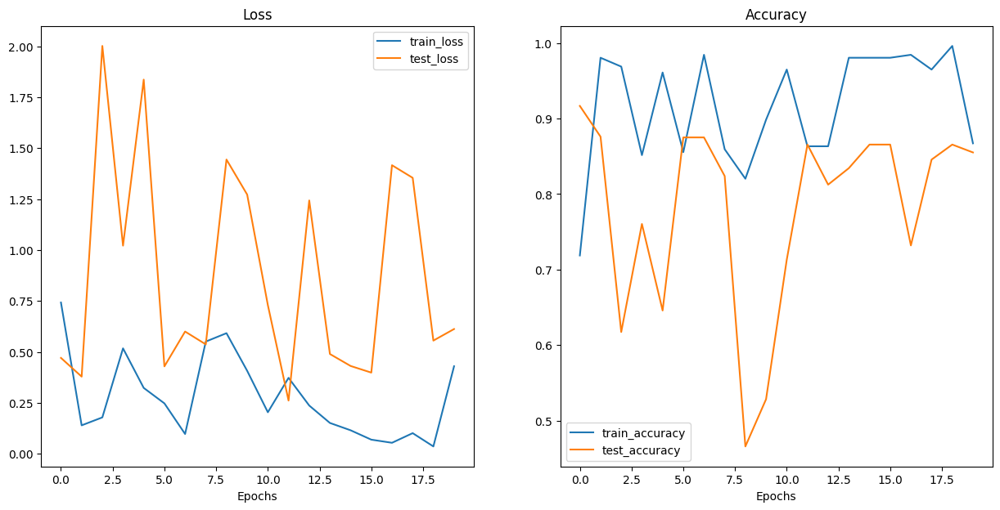

In [22]:
def plot_loss_curves(results: Dict[str, List[float]]):
    loss = results['train_loss']
    test_loss = results['test_loss']
    accuracy = results['train_acc']
    test_accuracy = results['test_acc']
    epochs = range(len(results['train_loss']))
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
plot_loss_curves(results)

# Confusion Matrix

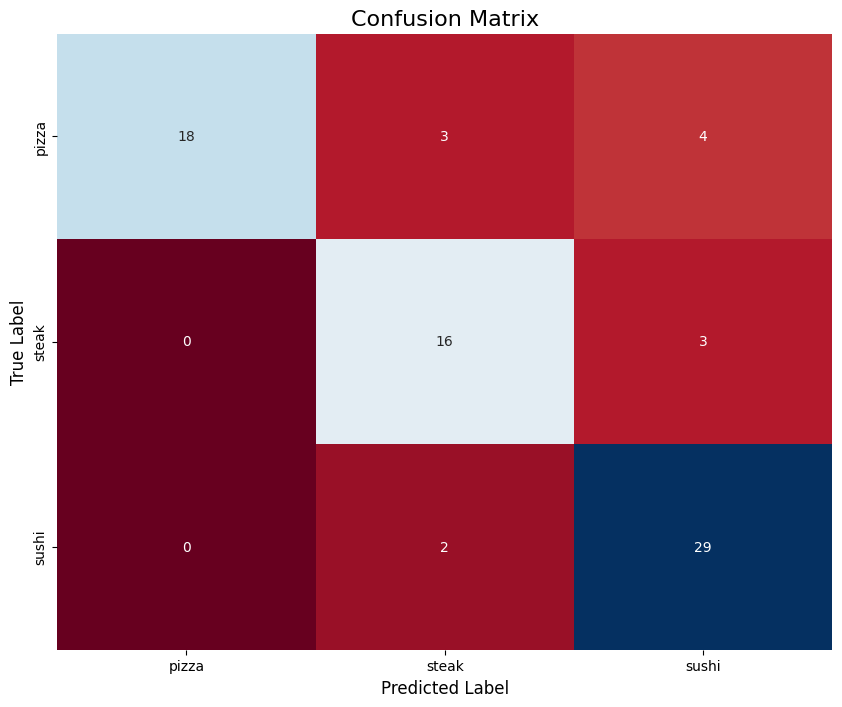

In [23]:
from sklearn.metrics import confusion_matrix
model.eval()

all_labels = []
all_preds = []
all_outputs = []
# Turn on inference mode
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = model(X)
        all_outputs.append(outputs.cpu().numpy())
        _, preds = torch.max(outputs, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from train data

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='RdBu', xticklabels=class_names, yticklabels=class_names, cbar=False)

# Add titles and labels
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)

# Display the plot
plt.show()

# Classification Report

In [24]:
from sklearn.metrics import classification_report
print(classification_report(all_labels,all_preds, target_names=class_names))

              precision    recall  f1-score   support

       pizza       1.00      0.72      0.84        25
       steak       0.76      0.84      0.80        19
       sushi       0.81      0.94      0.87        31

    accuracy                           0.84        75
   macro avg       0.86      0.83      0.83        75
weighted avg       0.86      0.84      0.84        75



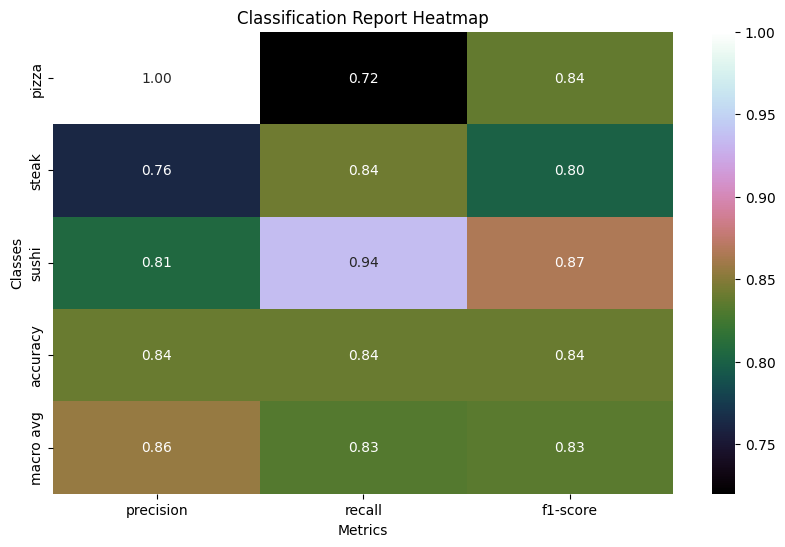

In [25]:
report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plotting the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, fmt=".2f", cmap="cubehelix")
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.show()

# Accuracy Score

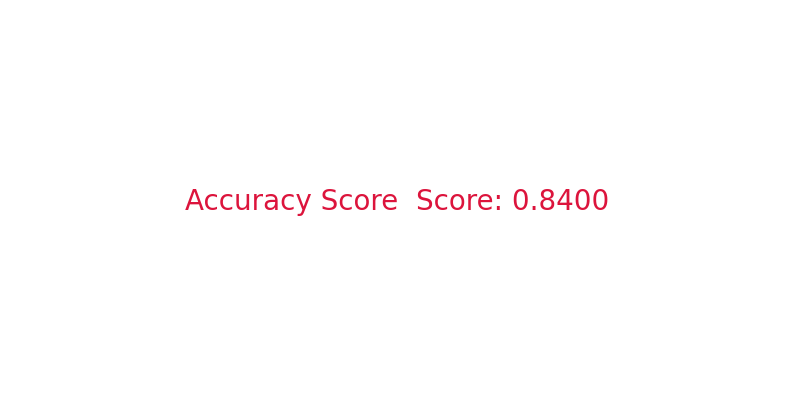

In [26]:
from sklearn.metrics import (
    accuracy_score,
    brier_score_loss,
    log_loss,
    matthews_corrcoef,
    roc_auc_score,
    cohen_kappa_score
)

plt.figure(figsize=(10,5),facecolor="white")
acc_score = accuracy_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Accuracy Score  Score: {acc_score:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

# ROC AUC Score

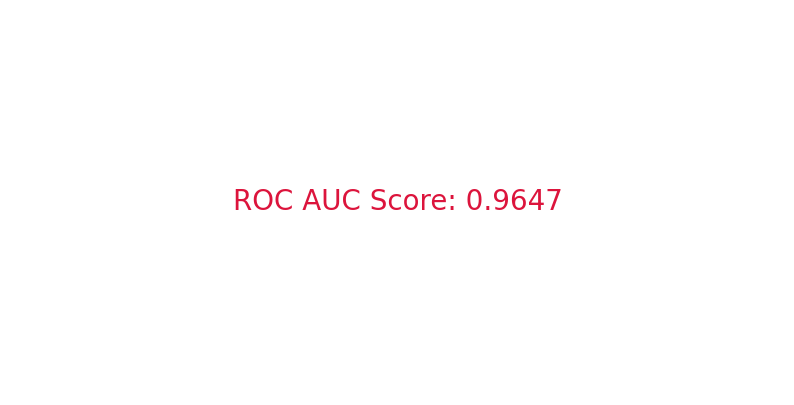

In [27]:
import numpy as np
model.eval()
all_labels = []
all_outputs = []

with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = model(X)
        
        # Apply softmax to get probabilities
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        all_outputs.append(probabilities.cpu().numpy())  # Collect probabilities

        all_labels.extend(y.cpu().numpy())

# Convert list of outputs to a 2D array
all_outputs = np.vstack(all_outputs)  # Stack the probabilities to get shape (n_samples, n_classes)

# Calculate ROC AUC score
roc_auc = roc_auc_score(all_labels, all_outputs, multi_class='ovr')

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'ROC AUC Score: {roc_auc:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()


# Cohen Kappa Score

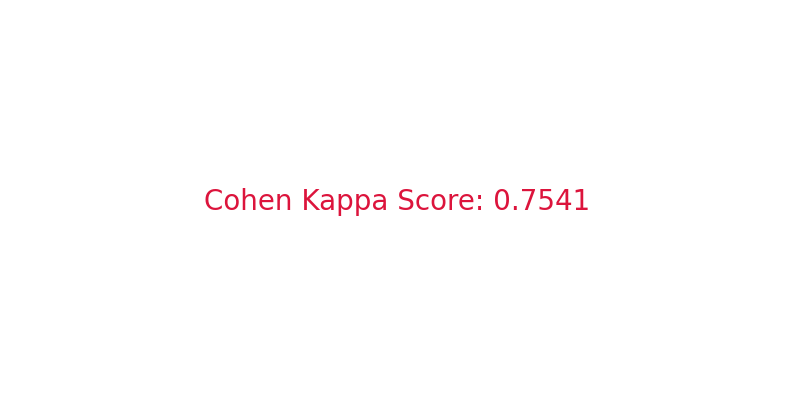

In [28]:
plt.figure(figsize=(10,5),facecolor="white")
kappa = cohen_kappa_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Cohen Kappa Score: {kappa:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

# Matthews Correlation Coefficien

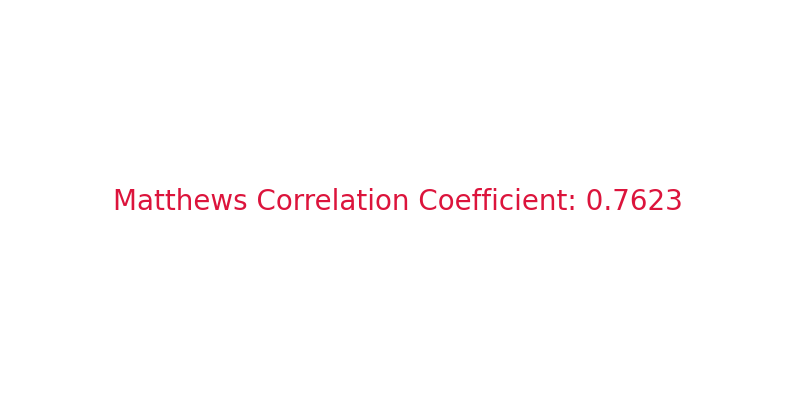

In [29]:
plt.figure(figsize=(10,5),facecolor="white")
mcc = matthews_corrcoef(all_labels,all_preds)


plt.plot([])
plt.text(0,0, f'Matthews Correlation Coefficient: {mcc:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()


# Calculate Brier Score Loss for each class

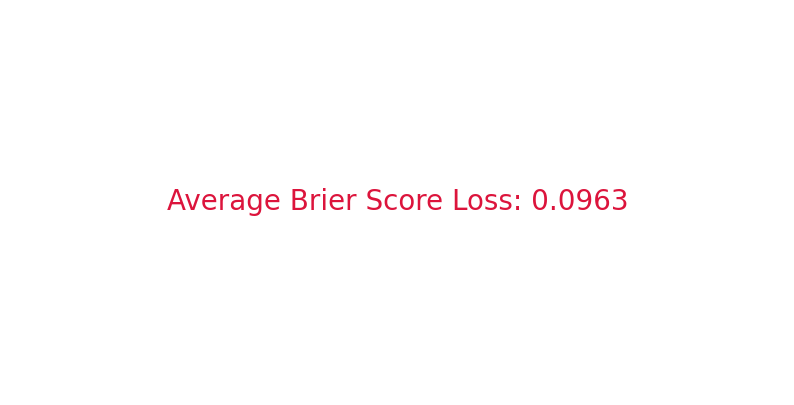

In [30]:
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_losses.append(brier_score_loss(y_true_binary, y_prob))

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'Average Brier Score Loss: {avg_brier_loss:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

# Calculate Brier Score Loss for each class

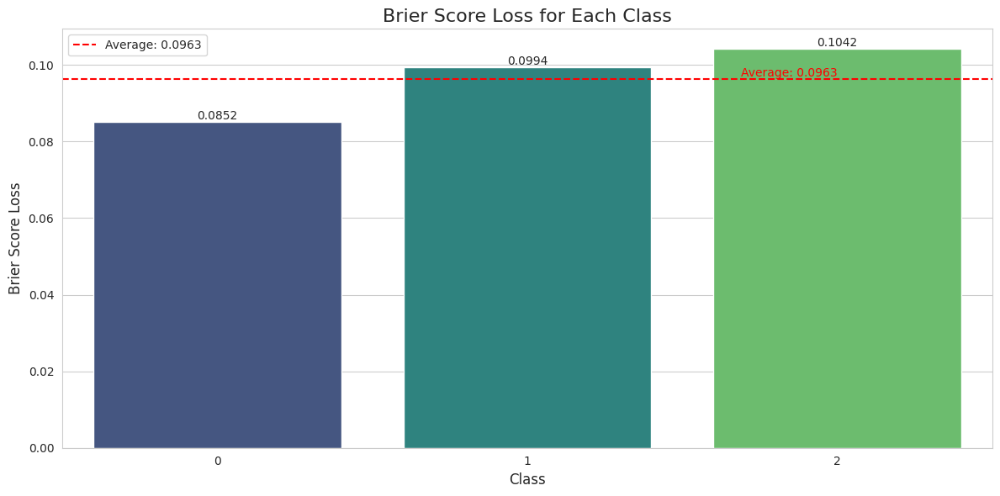

Class 0: Brier Score Loss = 0.0852
Class 1: Brier Score Loss = 0.0994
Class 2: Brier Score Loss = 0.1042
Average Brier Score Loss: 0.0963


In [31]:
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_loss = brier_score_loss(y_true_binary, y_prob)
    brier_losses.append(brier_loss)

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

# Create a DataFrame for Seaborn
df = pd.DataFrame({
    'Class': range(num_classes),
    'Brier Score Loss': brier_losses
})

# Plotting
plt.figure(figsize=(12, 6), facecolor='white')
sns.set_style("whitegrid")

# Create the bar plot
ax = sns.barplot(x='Class', y='Brier Score Loss', data=df, palette='viridis')

# Customize the plot
plt.title('Brier Score Loss for Each Class', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Brier Score Loss', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(brier_losses):
    ax.text(i, v, f'{v:.4f}', ha='center', va='bottom')

# Add a horizontal line for the average Brier Score Loss
plt.axhline(y=avg_brier_loss, color='r', linestyle='--', label=f'Average: {avg_brier_loss:.4f}')

# Add text for average Brier Score Loss
plt.text(num_classes-1, avg_brier_loss, f'Average: {avg_brier_loss:.4f}', 
         fontsize=10, va='bottom', ha='right', color='r')

plt.legend()
plt.tight_layout()
plt.show()

# Print out the Brier Score Loss for each class
for i, loss in enumerate(brier_losses):
    print(f"Class {i}: Brier Score Loss = {loss:.4f}")
print(f"Average Brier Score Loss: {avg_brier_loss:.4f}")

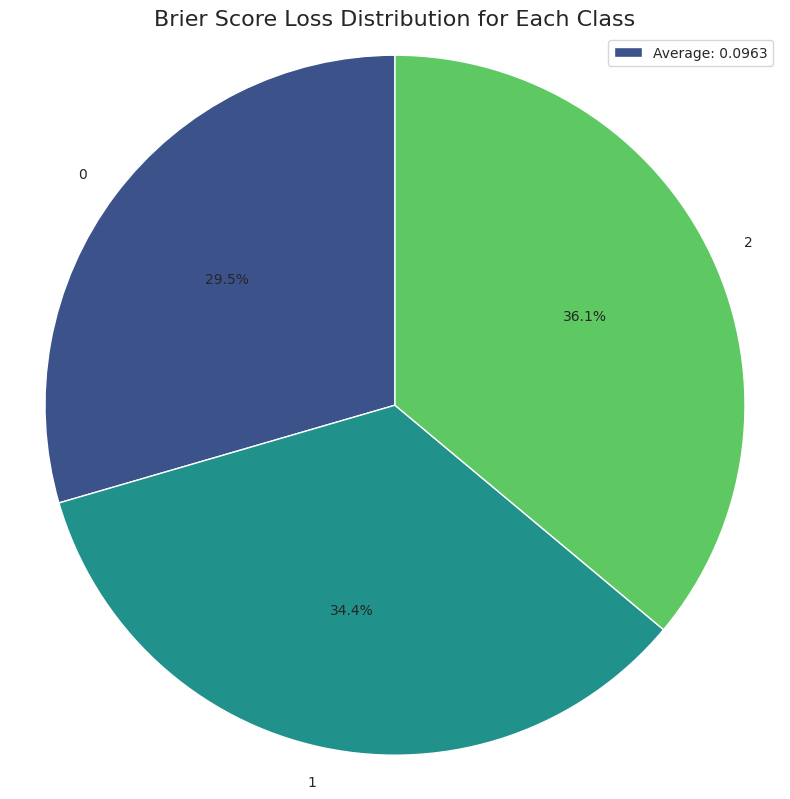

Class 0: Brier Score Loss = 0.0852
Class 1: Brier Score Loss = 0.0994
Class 2: Brier Score Loss = 0.1042
Average Brier Score Loss: 0.0963


In [32]:
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_loss = brier_score_loss(y_true_binary, y_prob)
    brier_losses.append(brier_loss)

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

# Create a DataFrame for Seaborn
df = pd.DataFrame({
    'Class': range(num_classes),
    'Brier Score Loss': brier_losses
})

# Plotting the pie chart
plt.figure(figsize=(8, 8), facecolor='white')
plt.pie(brier_losses, labels=df['Class'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette("viridis", num_classes))
plt.title('Brier Score Loss Distribution for Each Class', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show average Brier Score Loss as a legend
plt.legend([f'Average: {avg_brier_loss:.4f}'], loc='upper right')
plt.tight_layout()
plt.show()

# Print out the Brier Score Loss for each class
for i, loss in enumerate(brier_losses):
    print(f"Class {i}: Brier Score Loss = {loss:.4f}")
print(f"Average Brier Score Loss: {avg_brier_loss:.4f}")

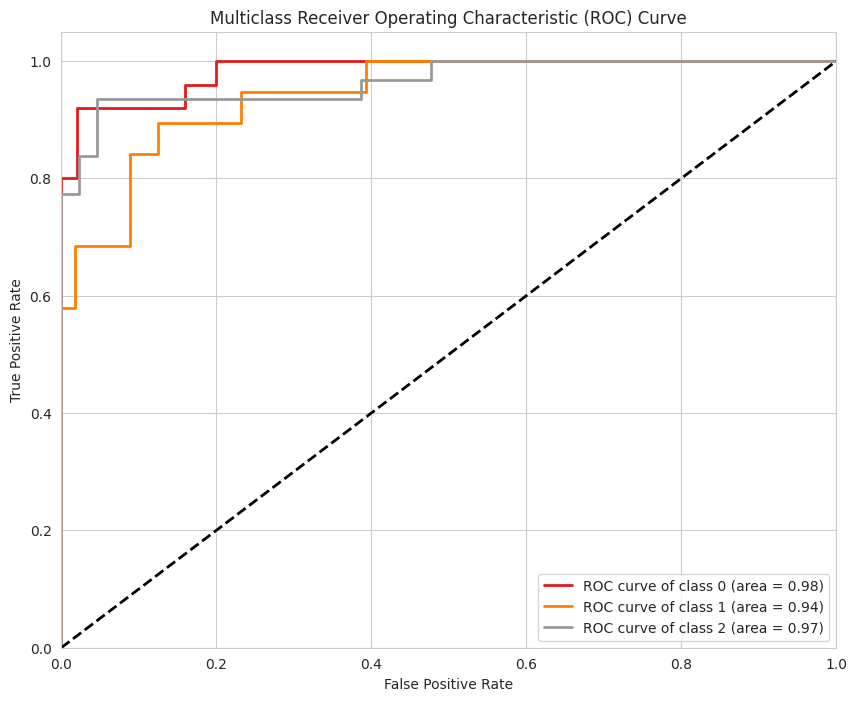

AUC for class 0: 0.9832
AUC for class 1: 0.9445
AUC for class 2: 0.9663
Micro-average AUC: 0.9545


In [33]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize



# Get the number of classes
num_classes = all_outputs.shape[1]

# Binarize the labels for multiclass ROC
all_labels_bin = label_binarize(all_labels, classes=range(num_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(all_labels_bin[:, i], all_outputs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))

# Use the new method to get colormaps
colors = plt.colormaps['Set1'](np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC for each class
for i in range(num_classes):
    print(f"AUC for class {i}: {roc_auc[i]:.4f}")

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(all_labels_bin.ravel(), all_outputs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
print(f"Micro-average AUC: {roc_auc['micro']:.4f}")


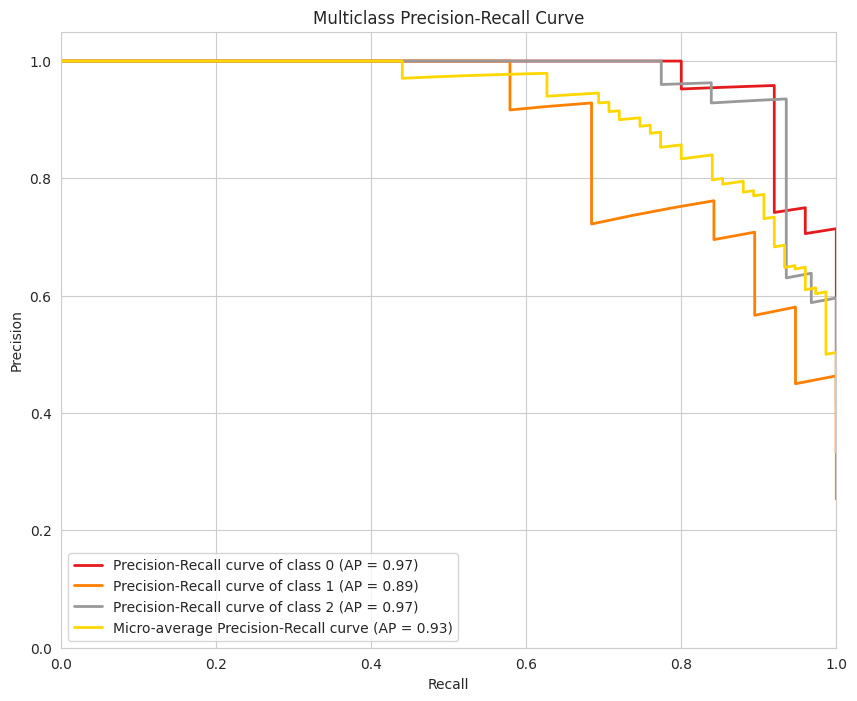

Average Precision for class 0: 0.9733
Average Precision for class 1: 0.8870
Average Precision for class 2: 0.9664
Micro-average Precision: 0.9254


In [34]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Get the number of classes
num_classes = all_outputs.shape[1]

# Binarize the labels for multiclass precision-recall curve
all_labels_bin = label_binarize(all_labels, classes=range(num_classes))

# Compute Precision-Recall curve and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(all_labels_bin[:, i], all_outputs[:, i])
    average_precision[i] = average_precision_score(all_labels_bin[:, i], all_outputs[:, i])

# Compute micro-average Precision-Recall curve and average precision
precision["micro"], recall["micro"], _ = precision_recall_curve(all_labels_bin.ravel(), all_outputs.ravel())
average_precision["micro"] = average_precision_score(all_labels_bin, all_outputs, average="micro")

# Plot Precision-Recall curves
plt.figure(figsize=(10, 8))

# Use the new method to get colormaps
colors = plt.colormaps['Set1'](np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-Recall curve of class {i} (AP = {average_precision[i]:.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', lw=2,
         label=f'Micro-average Precision-Recall curve (AP = {average_precision["micro"]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Multiclass Precision-Recall Curve')
plt.legend(loc="lower left")
plt.grid(True)
plt.show()

# Print Average Precision (AP) for each class
for i in range(num_classes):
    print(f"Average Precision for class {i}: {average_precision[i]:.4f}")

print(f"Micro-average Precision: {average_precision['micro']:.4f}")

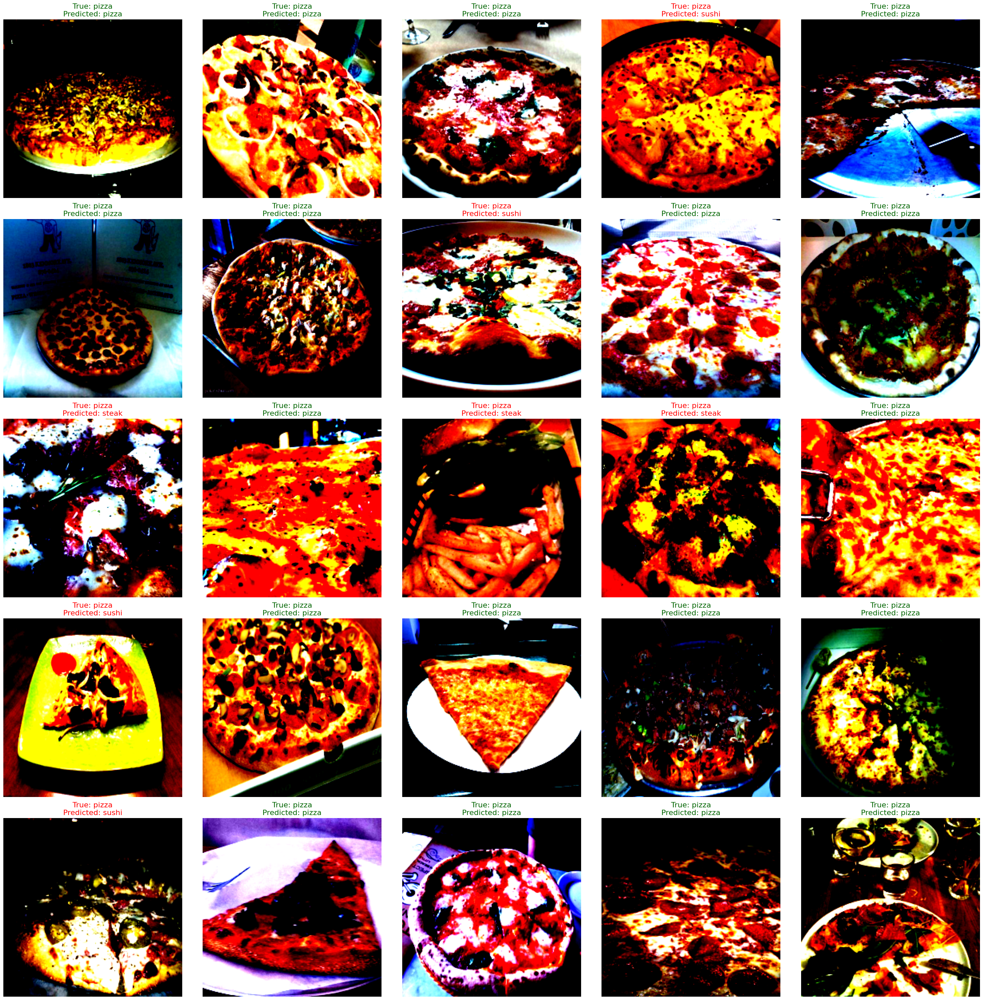

Overall accuracy: 0.78

Class-wise accuracy:
Accuracy of pizza: 18/25 (72.00%)
Accuracy of steak: 7/7 (100.00%)
Accuracy of sushi: No samples in this batch

Class distribution in this batch:
pizza: 25 samples
steak: 7 samples
sushi: 0 samples


In [35]:




def imshow(img):
    """Function to convert a tensor image to a NumPy array for visualization."""
    if isinstance(img, np.ndarray):
        npimg = img
    else:
        img = img / 2 + 0.5  # unnormalize
        npimg = img.numpy()

    if npimg.shape[0] == 3:  # Check if the image has 3 channels
        return np.transpose(npimg, (1, 2, 0))  # Rearrange dimensions for matplotlib
    else:
        return npimg

# Define the classes
classes = ['pizza', 'steak', 'sushi']
class_to_idx = {'pizza': 0, 'steak': 1, 'sushi': 2}

# Set the model to evaluation mode
model.eval()

# Get a batch of images
dataiter = iter(test_dataloader)
images, labels = next(dataiter)

# Move images and labels to the appropriate device
images, labels = images.to(device), labels.to(device)

# Get predictions
with torch.no_grad():
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)

# Convert to numpy for easy indexing
images = images.cpu().numpy()
labels = labels.cpu().numpy()
predicted = predicted.cpu().numpy()

# Plotting the images along with true and predicted labels
plt.figure(figsize=(30, 30))
number_images = (5, 5)
num_samples = min(number_images[0] * number_images[1], len(images))

for i in range(num_samples):
    plt.subplot(number_images[0], number_images[1], i + 1)
    plt.axis("off")
    
    true_label = classes[labels[i]]
    predicted_label = classes[predicted[i]]
    
    # Set title color based on whether prediction is correct
    color = "darkgreen" if true_label == predicted_label else "red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color, fontsize=16)
    plt.imshow(imshow(images[i]))

plt.tight_layout()
plt.show()

# Calculate overall accuracy
accuracy = (predicted == labels).mean()
print(f"Overall accuracy: {accuracy:.2f}")

# Print class-wise accuracy
print("\nClass-wise accuracy:")
for cls in classes:
    idx = class_to_idx[cls]
    class_correct = (predicted == labels)[labels == idx].sum()
    class_total = (labels == idx).sum()
    if class_total > 0:
        print(f"Accuracy of {cls}: {class_correct}/{class_total} ({100 * class_correct / class_total:.2f}%)")
    else:
        print(f"Accuracy of {cls}: No samples in this batch")

# Print class distribution in the batch
print("\nClass distribution in this batch:")
for cls in classes:
    idx = class_to_idx[cls]
    class_count = (labels == idx).sum()
    print(f"{cls}: {class_count} samples")
   

Predicted class: sushi


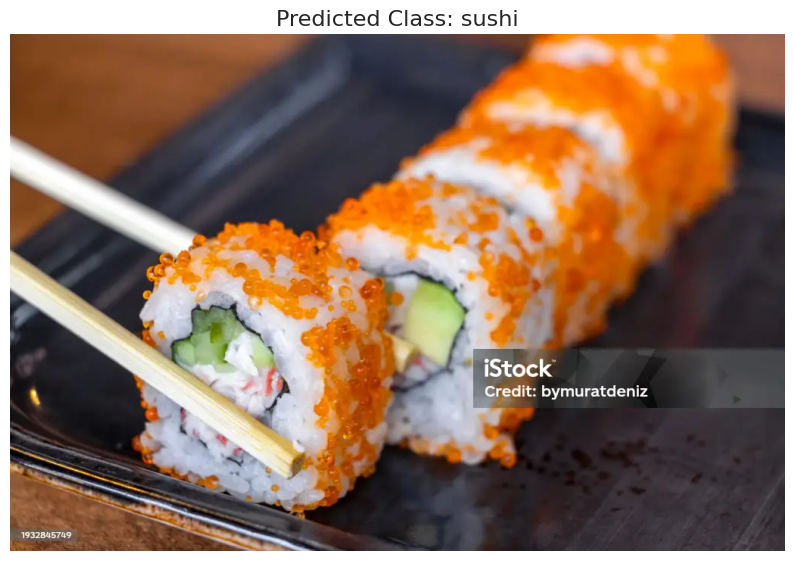

In [36]:
custom_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model's input dimensions
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
])

# Load and transform your custom data (image)
def load_image(image_path: str):
    image = Image.open(image_path).convert("RGB")  # Open and ensure image is RGB
    return image, custom_transform(image).unsqueeze(0)  # Return both raw and transformed image with batch dimension

# Prediction function
def predict_custom_data(model: torch.nn.Module, image_tensor: torch.Tensor, device: torch.device, class_names: list):
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():  # Disable gradient calculation
        image_tensor = image_tensor.to(device)  # Move image tensor to the same device as the model
        output = model(image_tensor)  # Get model predictions
        prediction = torch.argmax(output, dim=1)  # Get the index of the highest logit
        return class_names[prediction.item()]  # Convert index to class name

# Function to display the image with predicted label
def display_image_with_label(raw_image, predicted_class):
    plt.figure(figsize=(10, 8))
    plt.imshow(np.array(raw_image))  # Plot the raw image
    plt.title(f"Predicted Class: {predicted_class}", fontsize=16)  # Set the title with predicted label
    plt.axis('off')  # Hide axes
    plt.show()

# Your class names (use the same as when training the model)
class_names = ['pizza', 'steak', 'sushi']  # Replace with actual class names from your training data

# Path to your custom image
image_path = "/kaggle/input/custom-image-dataset/sushi.webp"

# Load and preprocess the image
raw_image, image_tensor = load_image(image_path)

# Load the trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Set the model to evaluation mode (important for inference)
model.eval()

# Predict the class for the custom image
predicted_class = predict_custom_data(model, image_tensor, device, class_names)

# Output the prediction and plot the image with label
print(f"Predicted class: {predicted_class}")
display_image_with_label(raw_image, predicted_class)